# V928 Tau - Opaque Disk

In this notebook we take the output of the stellar variation notebook and model the eclipse. We do this using the <strong>pyPplusS</strong> package designed by Rein & Odir 2019. We make the assumption that the two components of the binary are identical and thus that the deblended light curve just doubles the fluctuations about 1. We specifically look at an Opaque Disk model ($\tau = 1$).

In [1]:
import emcee
import logging
import numpy as np
import astropy.units as u
import astropy.constants as c
import matplotlib.pyplot as plt
from Code import mcmc, eclipse

%matplotlib inline

## Load the Data

In [2]:
time, flux_b, flux, error = eclipse.load_data('data/photometry/eclipse_lightcurve.txt')

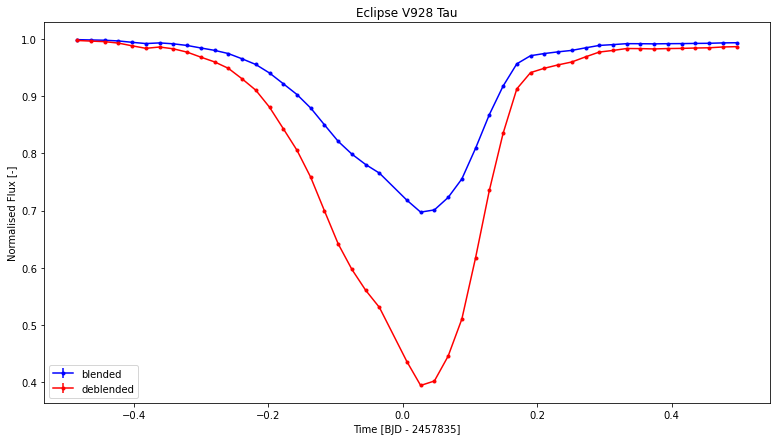

In [3]:
plt.figure(figsize=(13, 7))
plt.title('Eclipse V928 Tau')
plt.xlabel('Time [BJD - 2457835]')
plt.ylabel('Normalised Flux [-]')
plt.errorbar(time, flux_b, yerr=error, fmt='.', color='b', ls='-', label='blended')
plt.errorbar(time, flux, yerr=error, fmt='.', color='r', ls='-', label='deblended')
plt.legend()
plt.show()

## Model Set-up

This takes the <strong>disk_model()</strong> function from <strong>eclipse_functions</strong>, and creates the opaque disk model ($r_{\mathrm{edge}} = 0, \ \tau_{\mathrm{edge}} = 0, \ \tau_{\mathrm{disk}} = 0$)

In [4]:
# model functions
pack_od = lambda rd, b, inc, tilt, vel, dx: (rd, 0., b, inc, tilt, vel, dx, 1., 0.)
opaque_disk      = lambda P, time: eclipse.disk_model(pack_od(*P), time)
opaque_prior      = lambda P: eclipse.disk_prior(pack_od(*P))

In [5]:
# Bounds of the parameters (t = tilt, T = tau, rest as above)
rl, ru = (0., 10.)
bl, bu = (-10.,10.)
il, iu = (0., np.pi/2.)
tl, tu = (0., np.pi/2.)
vl, vu = (5.9, 20.)
xl, xu = (-10.,10.)
Tl, Tu = (0.,1.)

## Opaque Disk

In [6]:
# setting the the parameter names, units and bounds
lbls_od = ['disk radius', 'impact parameter', 'inclination', 'tilt', 'velocity', 
           'time shift']
units_od = ['R*', 'R*', 'deg', 'deg', 'R*/day', 'day']
bounds_od = [(rl, ru/2.), (bl/2., bu/2.), (iu/2., iu), (tl, tu), (vl, vu/2.), (-0.5, 0.5)]

# set-up intial guess for the opaque disk
pargs_od = (6, 1000, bounds_od)
p0_od = eclipse.useful_p0(mcmc.bounded_p0, pargs_od, opaque_disk, time, False, 4)

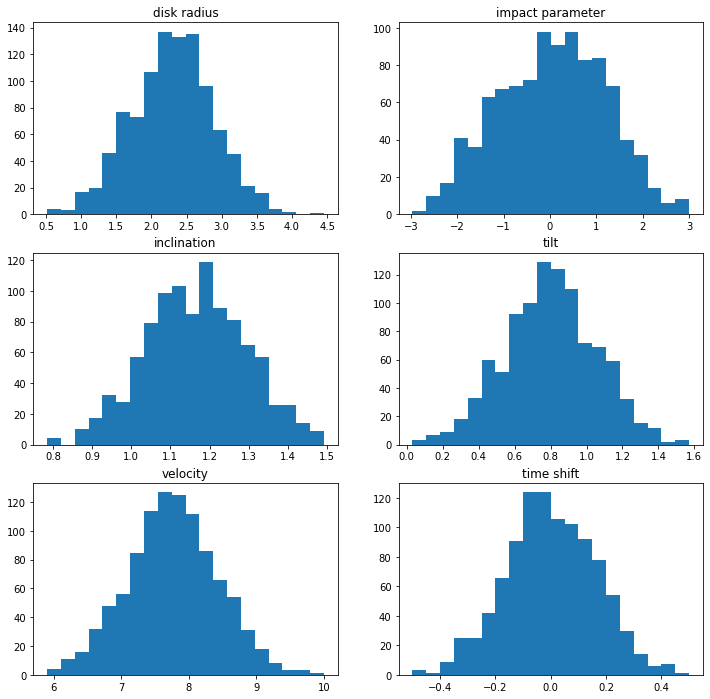

In [7]:
# plot intial guess histogram
mcmc.plot_hist(p0_od, lbls=lbls_od)

In [8]:
# mcmc parameters for opaque disk
be_od = 'models/mcmc_backends/opaque_disk.h5'
args_od = (time, flux, error, opaque_disk, opaque_prior)
BE_od = emcee.backends.HDFBackend(be_od)

# run mcmc for opaque disk
#p_od, sampler_od = mcmc.run_mcmc(*args_od, p0_od, 1000, reset=False, savename=be_od)

# load mcmc for opaque disk
sampler_od = emcee.EnsembleSampler(1000, 6, mcmc.lnprob, args=args_od, backend=BE_od)

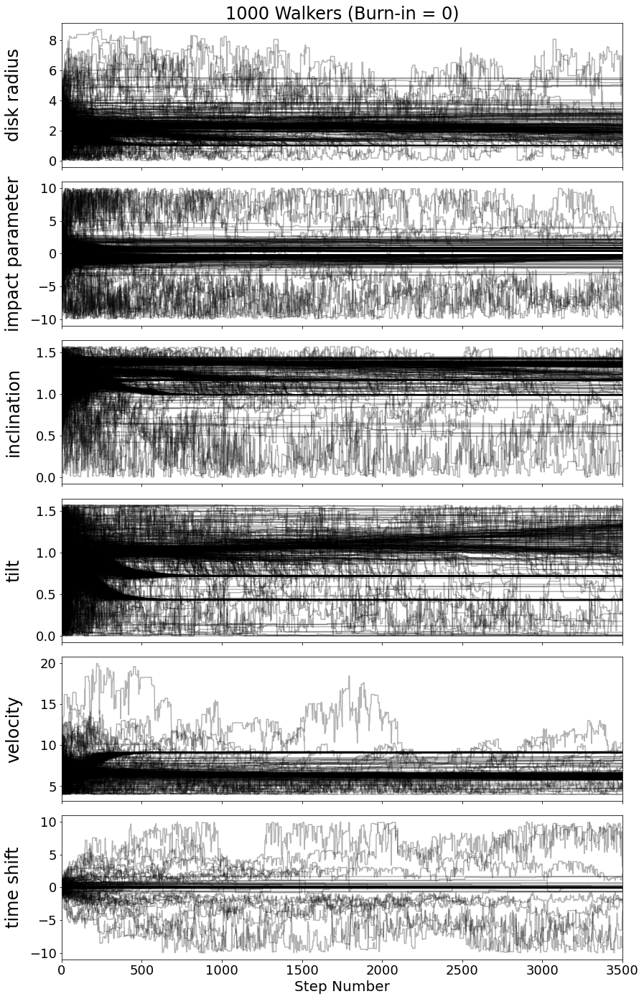

In [9]:
# plot the walkers for the opaque disk
mcmc.plot_walkers(sampler_od, lbls=lbls_od)

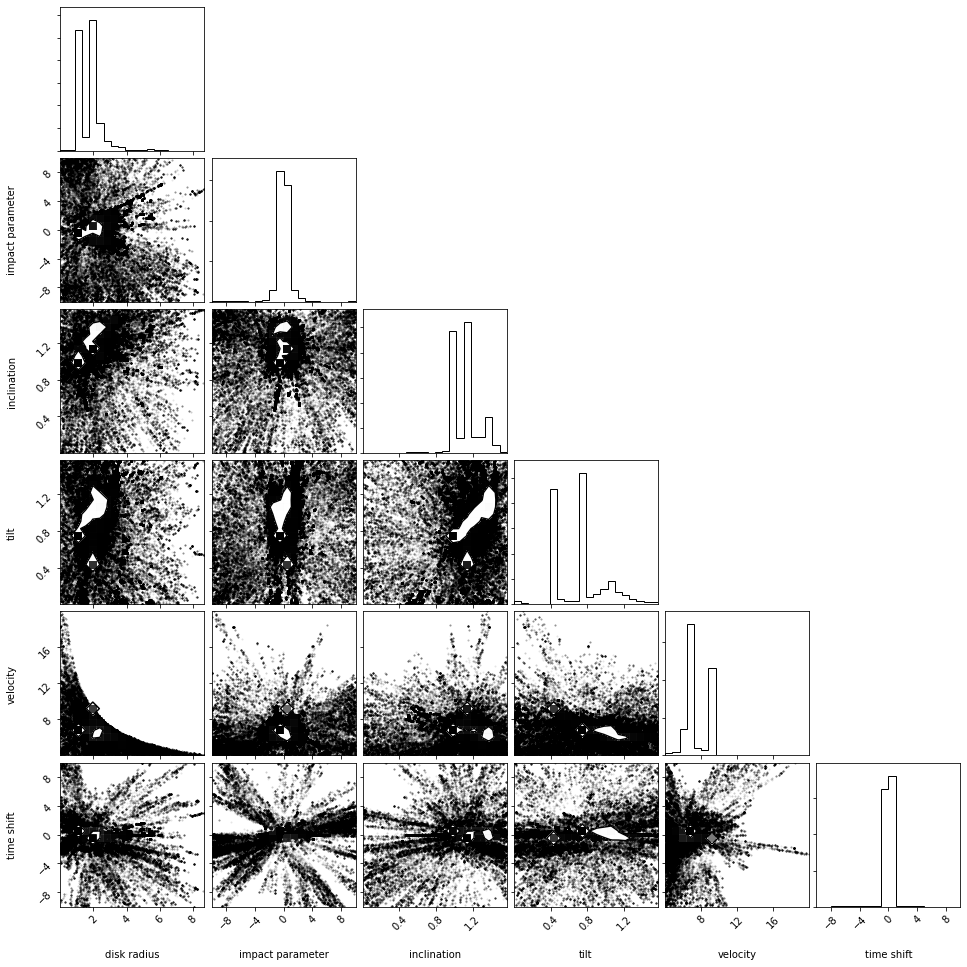

In [10]:
# plot the triangle for the opaque disk
mcmc.plot_triangle(sampler_od, lbls=lbls_od)

From these plots it is very clear that there are two very sharp solutions. This is clear from two high peaks in disk radius, two high peaks in inclination (a smaller third), two high peaks in tilt (a smaller third), two peaks in velocity. Note also that impact parameter and time shift are very thick peaks (possibly two next to each other). As becomes apparent from the orbital analysis notebook velocity is key, so we'll start by extracting the velocity solutions.

### Separating Solutions (Velocity) for the Opaque Disk

Here we extract the solutions with velocities above and below 8 $R_*$/day.

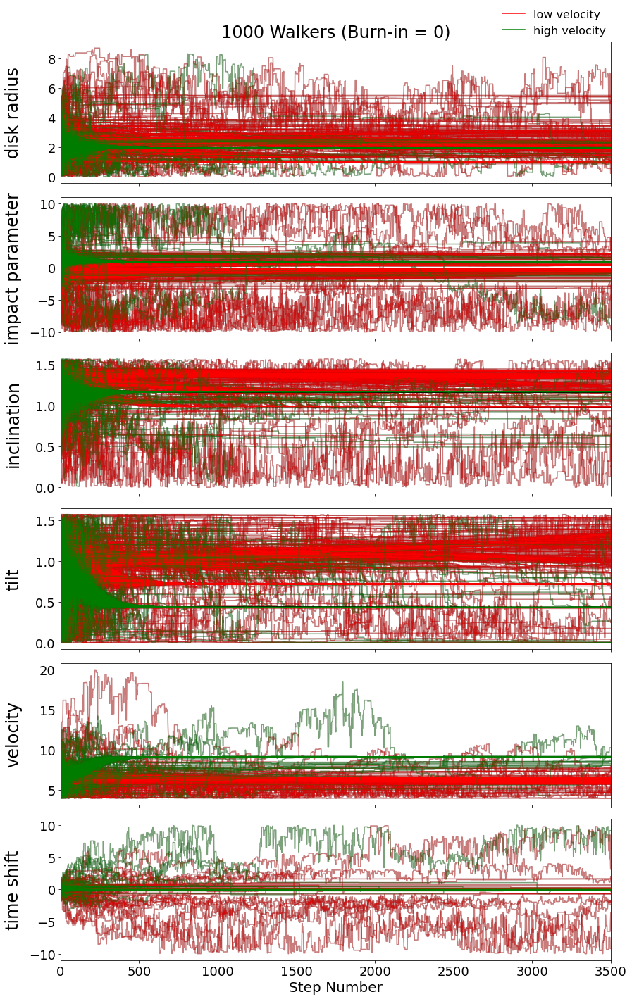

In [11]:
# extracting the low and high velocity solutions for the opaque disk
vel_names_od = ['low velocity', 'high velocity']
lvel_od, hvel_od = mcmc.extract_solutions(sampler_od, [4, 4], [(0, 8), (8, 20)], 0, lbls_od, vel_names_od)


#### High Velocity Solutions for the Opaque Disk

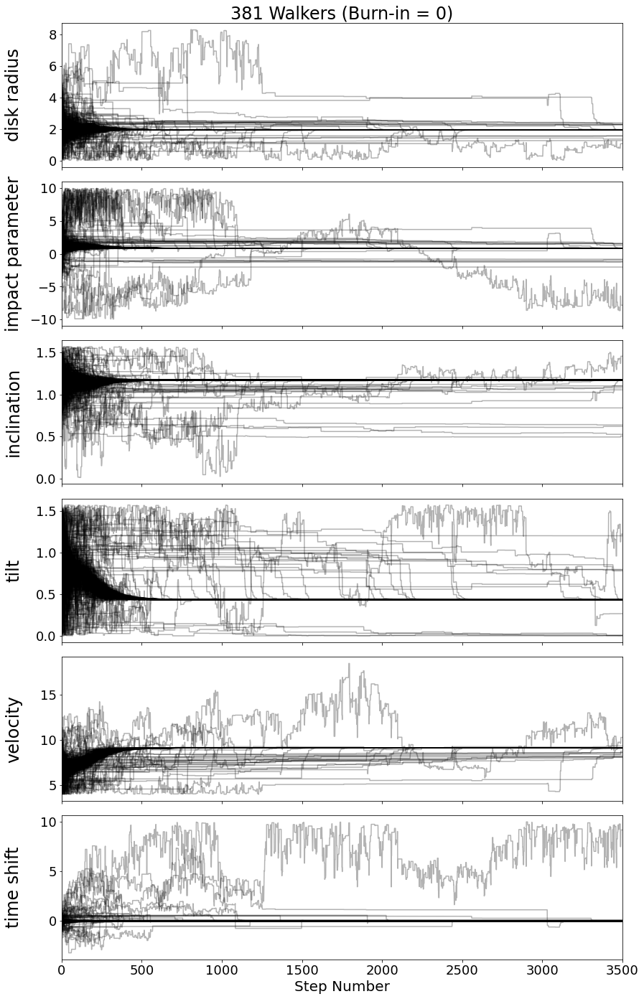

In [12]:
# plot the high velocity walkers for the opaque disk
mcmc.plot_walkers(hvel_od, lbls=lbls_od)

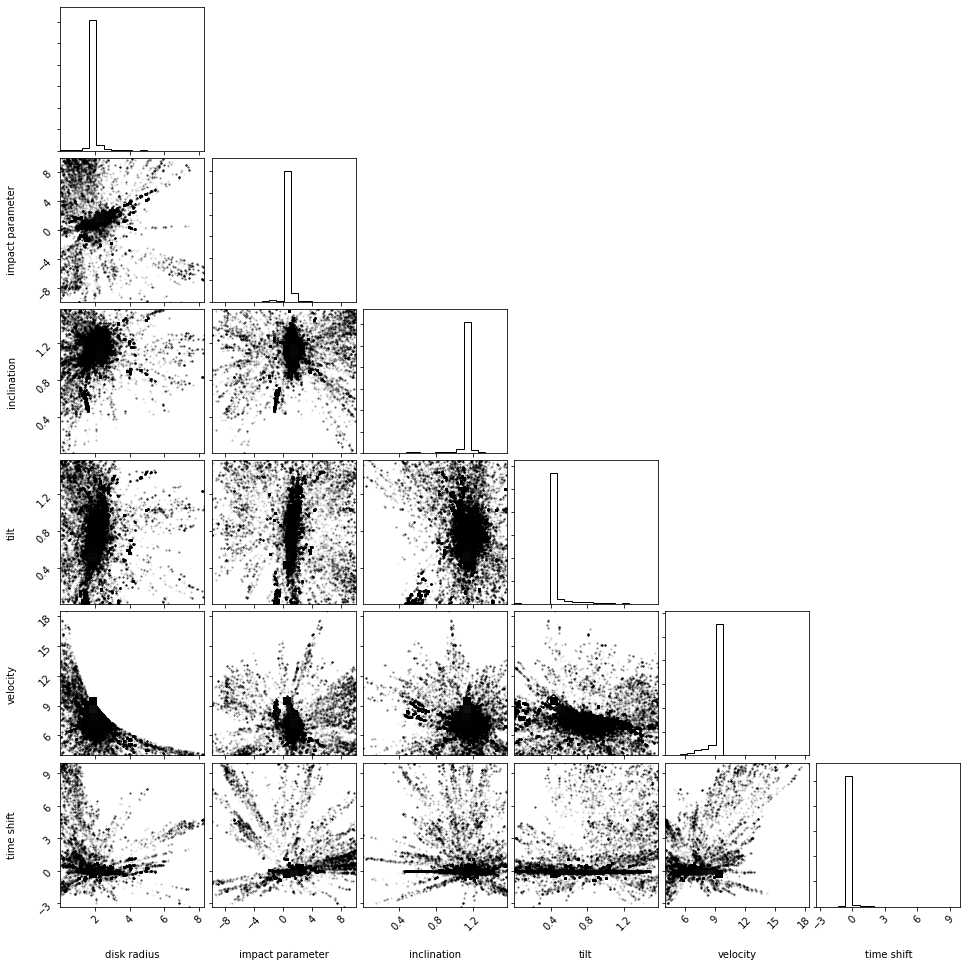

In [13]:
# plot the high velocity triangle for the opaque disk
mcmc.plot_triangle(hvel_od, lbls=lbls_od)

Clearly there is just one peak where everything moves to so we can cut away the burn-in time and carry out the statistics to get a best fit solution for the high-velocity set of solutions. To check we plot the walkers and the triangle plot.

100%|██████████| 500/500 [00:39<00:00, 12.68it/s]


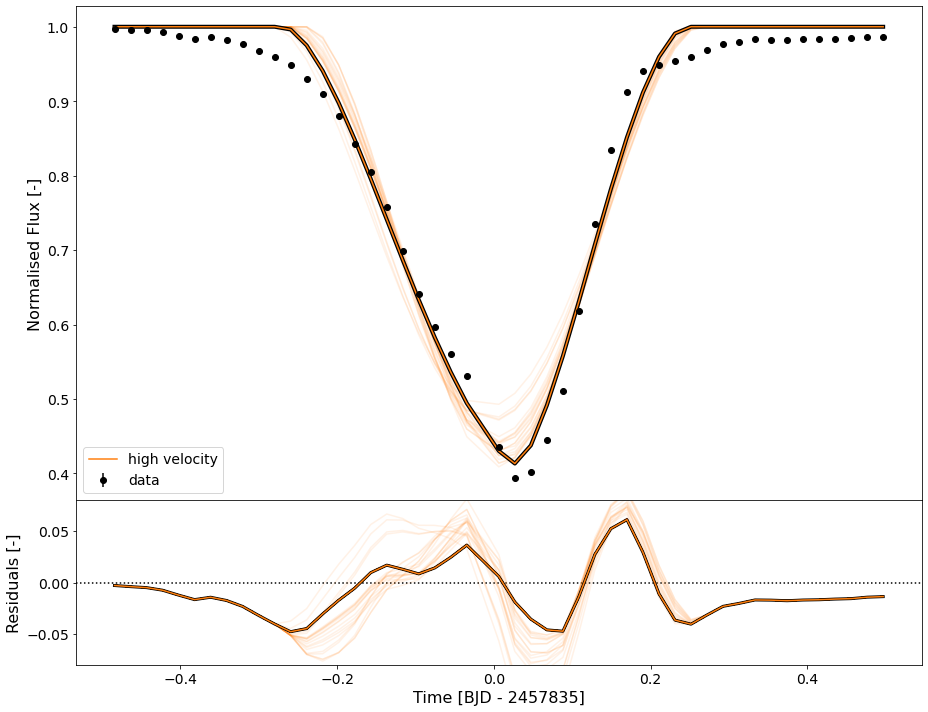

In [14]:
# deciding the burn-in for the high velocity solutions for the opaque disk
cut_hvel_od = 500

# carrying out statistics for the high velocity solutions for the opaque disk
stats_hvel_od, pb_hvel_od = mcmc.stats(hvel_od, cut=cut_hvel_od)

# making plot of the samples for the high velocity solutions for the opaque disk
_ = mcmc.plot_samples(time, flux, error, [opaque_disk], [hvel_od], ['high velocity'], cut_hvel_od, 500, 
                      best_fit=True, dt=3002, residual_lims=(-0.08, 0.08))

In [15]:
# printing the high velocity best-fit solution for the opaque disk
mcmc.print_parameters(pb_hvel_od, lbls_od, units_od)

disk radius        =     +1.939238     [R*]
impact parameter   =     +0.851913     [R*]
inclination        =     +67.11369     [deg]
tilt               =     +24.83339     [deg]
velocity           =     +9.135350     [R*/day]
time shift         =     -0.058551     [day]


#### Low Velocity Solutions for the Opaque Disk

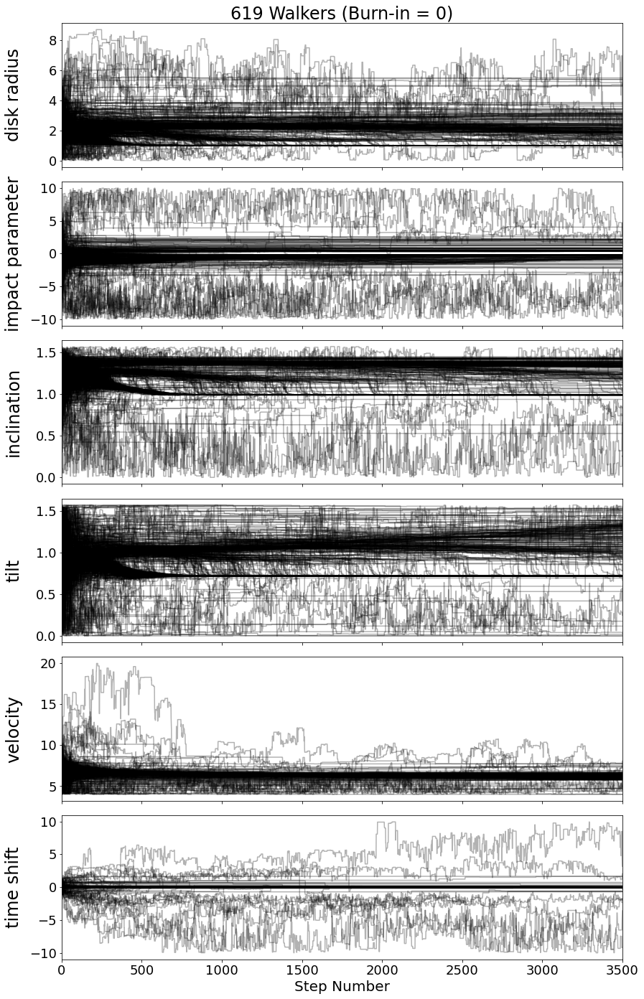

In [16]:
# plot the low velocity walkers for the opaque disk
mcmc.plot_walkers(lvel_od, lbls=lbls_od)

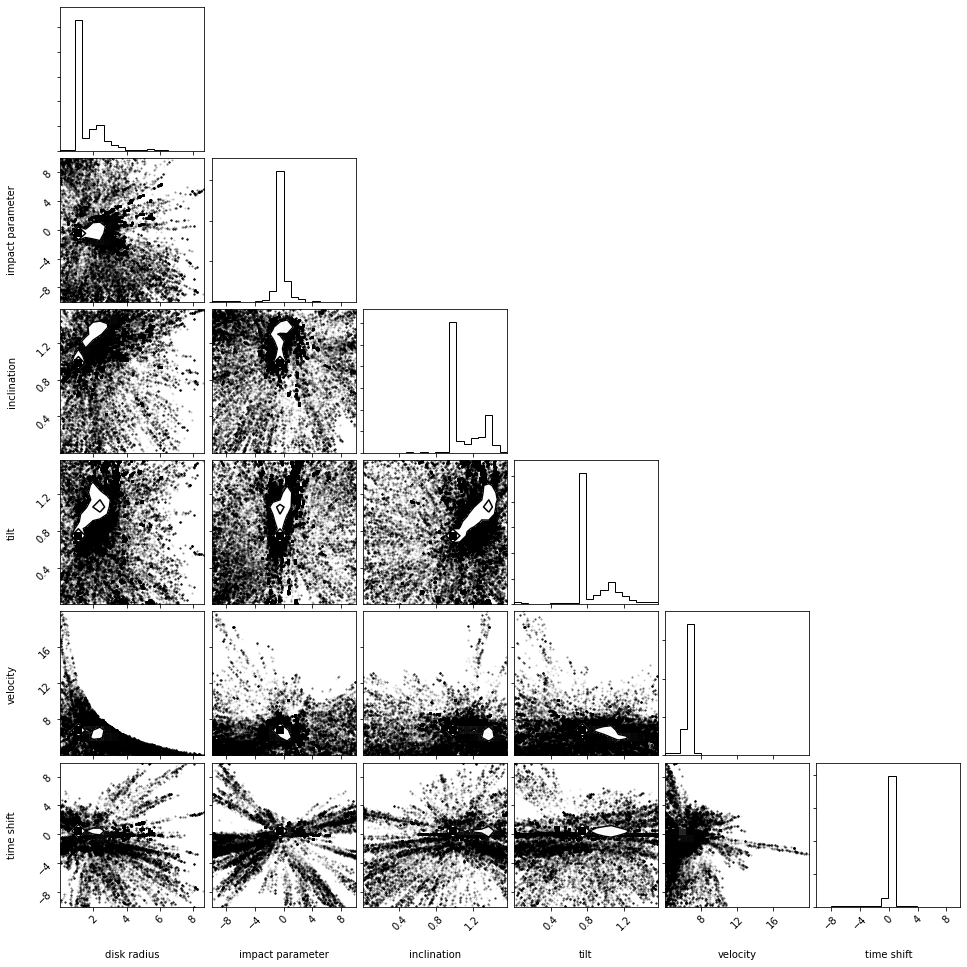

In [17]:
# plot the low velocity triangle for the opaque disk
mcmc.plot_triangle(lvel_od, lbls=lbls_od)

These plots suggest that there are two peaks. These are visible in radius, inclination, and tilt. We focus on the disk radius split as we are interested in the smallest solutions of the disk.

### Separating Low Velocity Solutions (Disk Radius) for the Opaque Disk

Here we extract the solutions with disk radii below and above 1.5 $R_*$

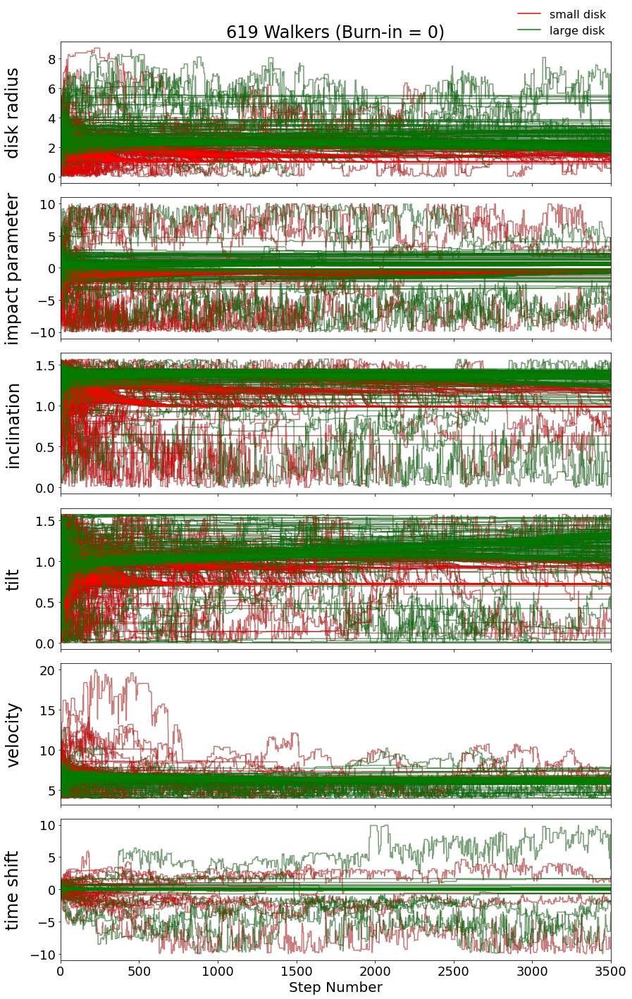

In [18]:
# extract low velocity disk radii solutions for the opaque disk
dr_names_od = ['small disk', 'large disk']
ldr_od, hdr_od = mcmc.extract_solutions(lvel_od, [0, 0], [(0, 1.5), (1.5, 20)], 0, lbls_od, dr_names_od)

#### Low Velocity, High Disk Radii Solutions for the Opaque Disk

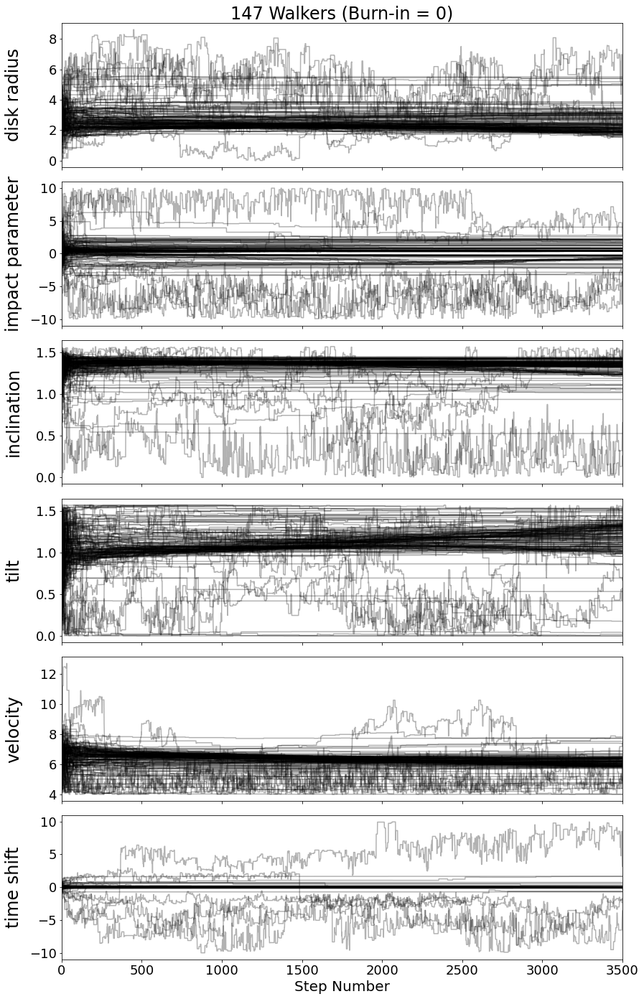

In [19]:
# plot the low velocity high disk radii walkers for the opaque disk
mcmc.plot_walkers(hdr_od, lbls=lbls_od)

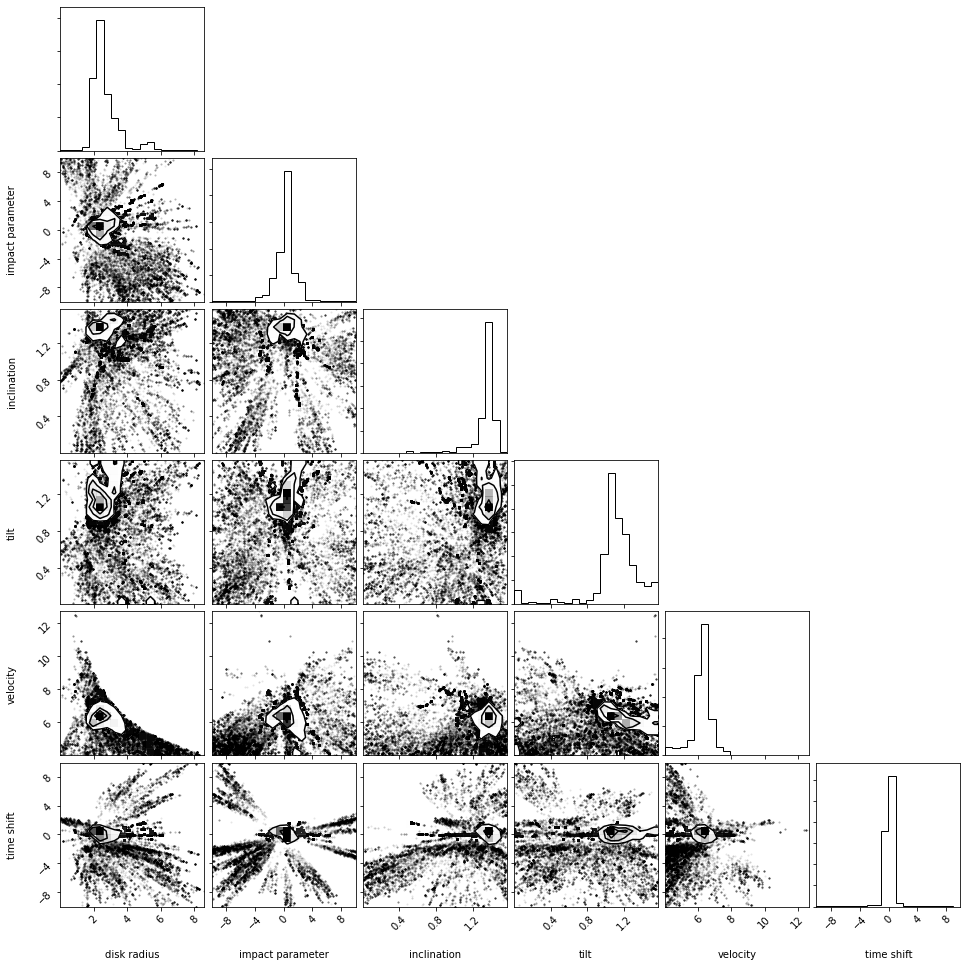

In [20]:
# plot the low velocity high disk radii triangle for the opaque disk
mcmc.plot_triangle(hdr_od, lbls=lbls_od)

We see one solution, but we see a very wide spread, and this is because we have only 147 walkers. Note that this is less than 15% of the original sample. Due to this fact we scrap this solution.

# CHECK THE PB ON THIS AND WHETHER YOU WANT TO CONTINUE HERE

100%|██████████| 500/500 [00:36<00:00, 13.81it/s]


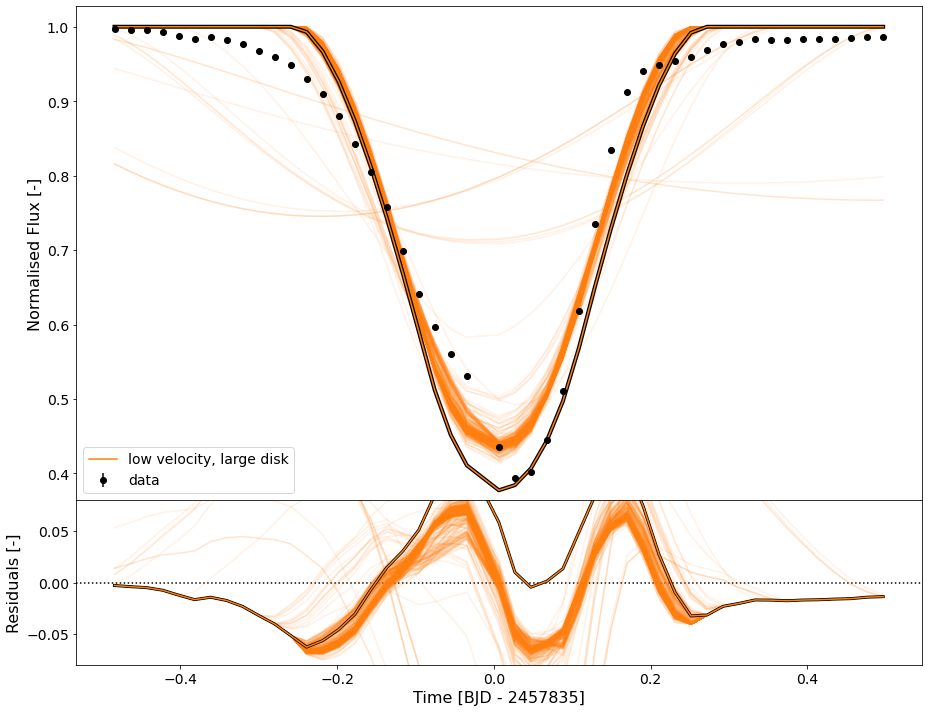

In [21]:
# determine burn-in for the low velocity high disk radii solutions for the opaque disk
cut_hdr_od = 500

# carry out statistics for the low velocity high disk radii solutions for the opaque disk
stats_hdr_od, pb_hdr_od = mcmc.stats(hdr_od, cut=cut_hdr_od)

# plotting samples for the low velocity high disk radii solutions for the opaque disk
_ = mcmc.plot_samples(time, flux, error, [opaque_disk], [hdr_od], ['low velocity, large disk'], cut_hdr_od, 
                      500, best_fit=True, dt=3002, residual_lims=(-0.08, 0.08))

In [22]:
# printing best-fit parameters for the low velocity high disk radii solutions for the opaque disk
mcmc.print_parameters(pb_hdr_od, lbls_od, units_od)

disk radius        =     +2.388550     [R*]
impact parameter   =     +0.392506     [R*]
inclination        =     +78.25017     [deg]
tilt               =     +64.24264     [deg]
velocity           =     +6.252525     [R*/day]
time shift         =     -0.019285     [day]


#### Low Velocity, Small Disk Radii Solutions for the Opaque Disk

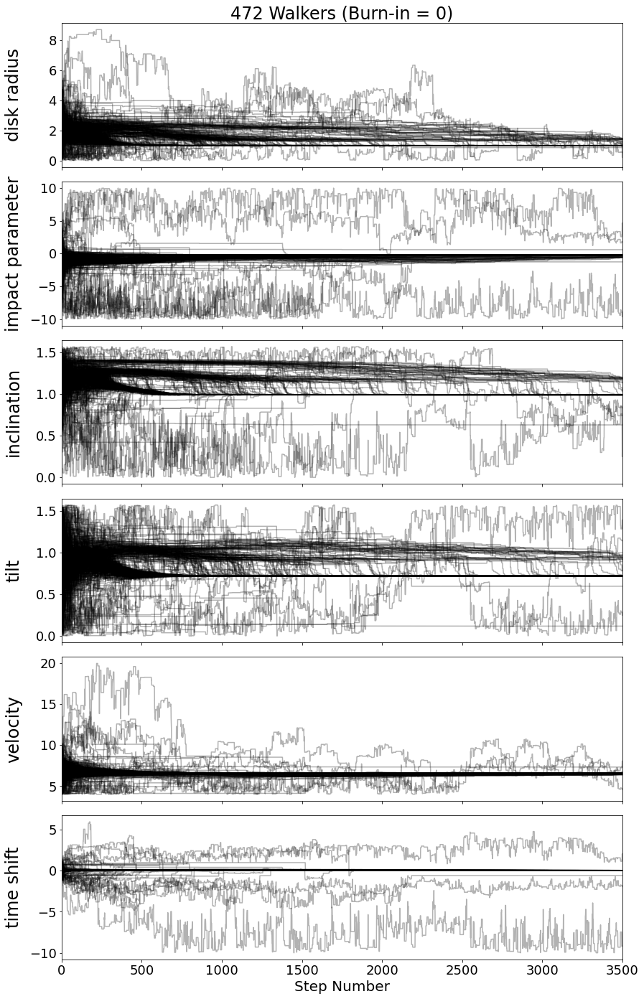

In [23]:
# plot the low velocity low disk radii walkers for the opaque disk
mcmc.plot_walkers(ldr_od, lbls=lbls_od)

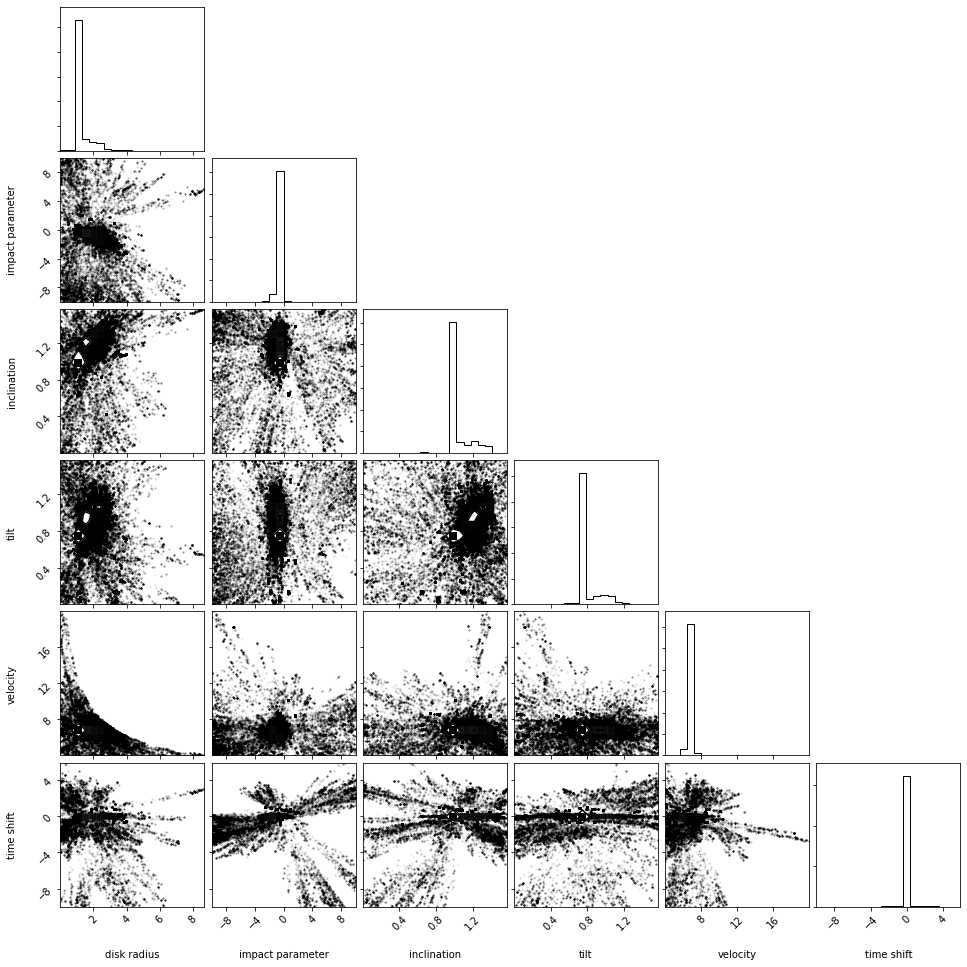

In [24]:
# plot the low velocity low disk radii triangle for the opaque disk
mcmc.plot_triangle(ldr_od, lbls=lbls_od)

Looks like one solution, let's cut out the burn-in (1000 steps)

100%|██████████| 500/500 [00:41<00:00, 12.10it/s]


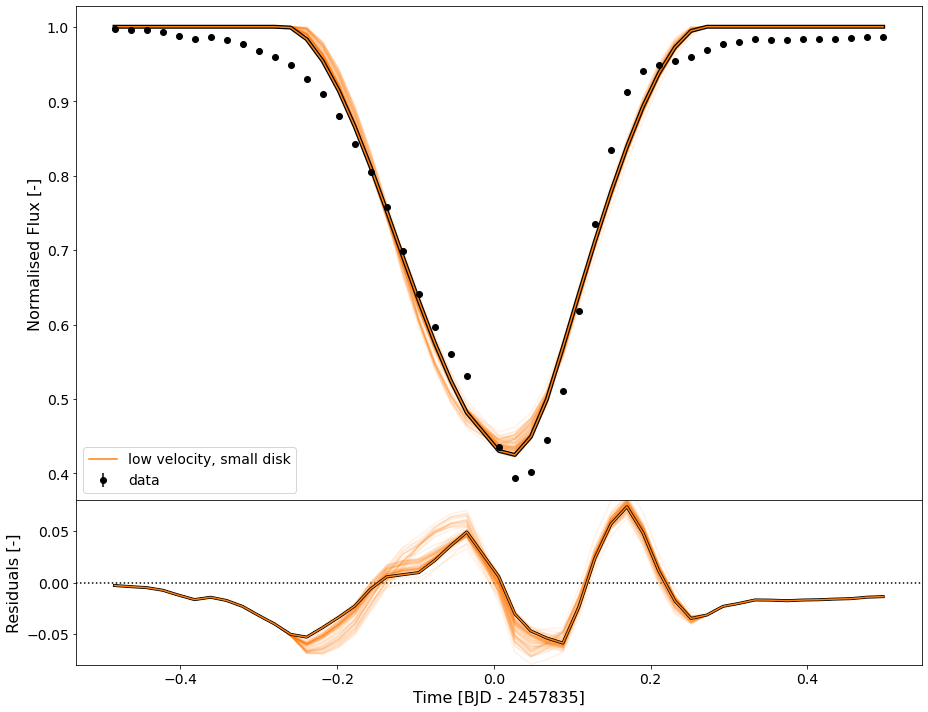

In [25]:
# determining the burn-in for the low velocity low disk radii solutions for the opaque disk
cut_ldr_od = 1000

# carrying out statistics for the low velocity low disk radii solutions for the opaque disk
stats_ldr_od, pb_ldr_od = mcmc.stats(ldr_od, cut=cut_ldr_od)

# plotting samples for the low velocity low disk radii solutions for the opaque disk
_ = mcmc.plot_samples(time, flux, error, [opaque_disk], [ldr_od], ['low velocity, small disk'], cut_ldr_od, 
                      500, best_fit=True, dt=3002, residual_lims=(-0.08, 0.08))

In [26]:
# printing best fit parameters for the low velocity low disk radii solutions for the opaque disk
mcmc.print_parameters(pb_ldr_od, lbls_od, units_od)

disk radius        =     +0.992294     [R*]
impact parameter   =     -0.250570     [R*]
inclination        =     +56.78165     [deg]
tilt               =     +41.21967     [deg]
velocity           =     +6.636696     [R*/day]
time shift         =     +0.009899     [day]


### Compare Opaque Disk Solutions

Here we compare all the opaque disk solutions in the preceding sections.

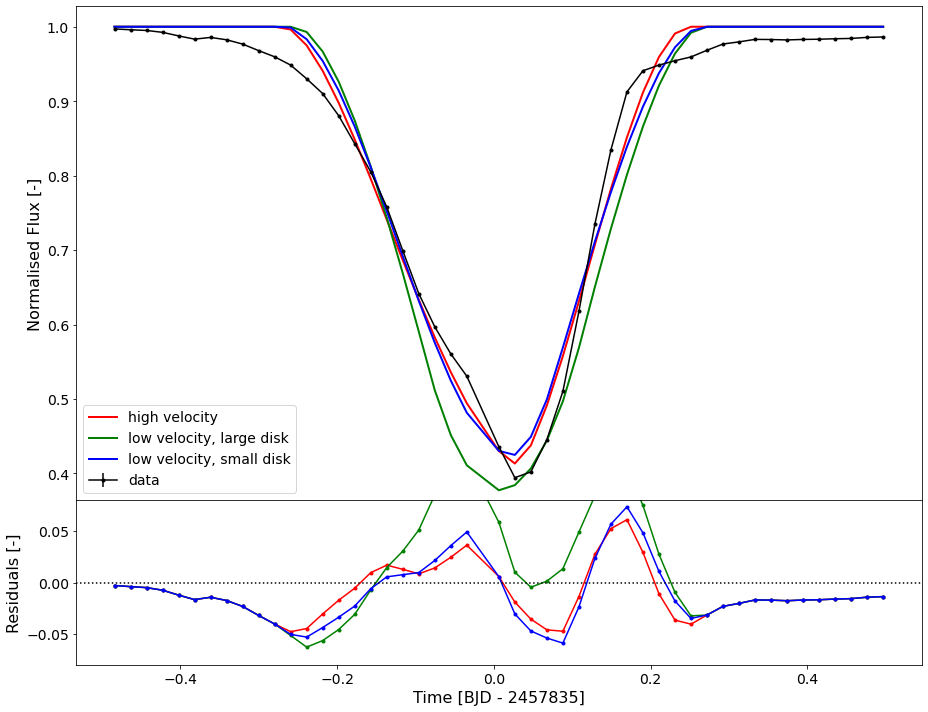

In [27]:
chi2s_od = mcmc.plot_models(time, flux, error, 3*[opaque_disk], [pb_hvel_od, pb_hdr_od, pb_ldr_od], 
                      ['high velocity', 'low velocity, large disk','low velocity, small disk'], 
                      dt=3002, residual_lims=(-0.08, 0.08), lw=2)

In [28]:
print('chi2 for the opaque disk with high velocity is -            %.6f' % chi2s_od[0])
print('chi2 for the opaque disk with low velocity, large disk is - %.6f' % chi2s_od[1])
print('chi2 for the opaque disk with low velocity, small disk is - %.6f' % chi2s_od[2])

chi2 for the opaque disk with high velocity is -            2682609.334881
chi2 for the opaque disk with low velocity, large disk is - 8069876.331562
chi2 for the opaque disk with low velocity, small disk is - 3540913.901160


In [29]:
# saving the best fit models for the opaque disks
np.save('models/best_fits/opaque_disk_high_velocity.npy', pb_hvel_od)
np.save('models/best_fits/opaque_disk_low_velocity_small_disk.npy', pb_ldr_od)

## Depict Disks

In this section a visual representation of the best-fit disks is presented.

In [7]:
# defining model time
model_time = np.linspace(-0.5, 0.5, 1001)

the star has a linear limb-darkening parameter of 0.7220
the disk system is inclined by 67.11 [deg] and tilted by 24.83 [deg]     with an impact parameter of 0.85 [R*]
the disk system travels at 9.14 [R* / day] and is offset by -0.06     days
    ring 1 with r_in = 0.0000, r_out = 1.9392 and tau = 1.0000


/Users/dmvandam/SurfDrive/phd/github/v928tau/pyPplusS/segment_models.py:452: RuntimeWarning: invalid value encountered in less
  todo_start = np.all(np.logical_or(splitr[:,2:]<rcrit,np.isnan(splitr[:,2:])),-1)


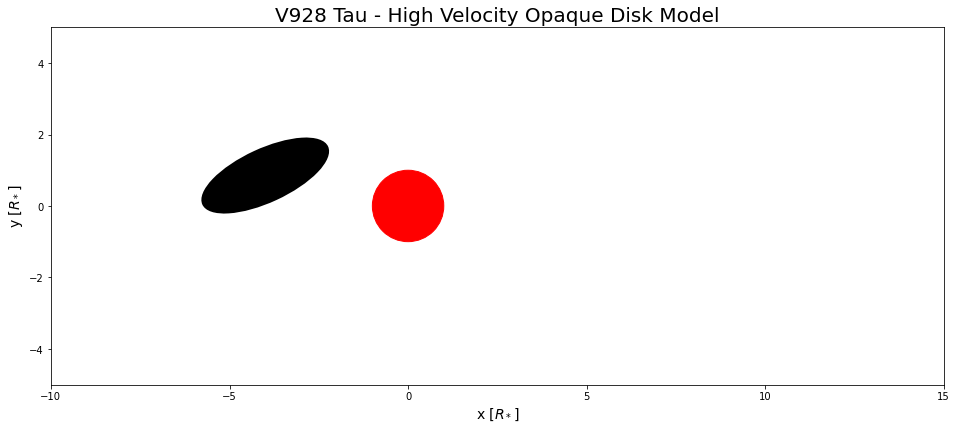

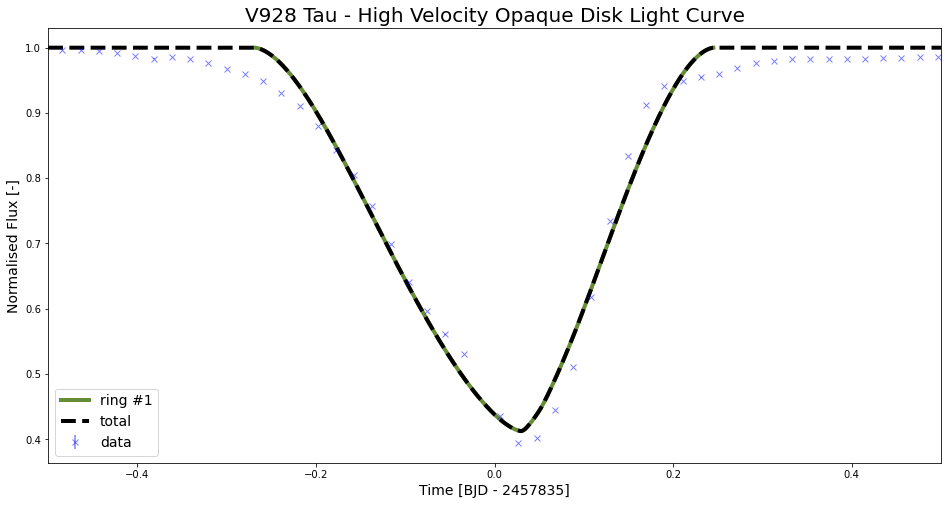

In [8]:
# for the high velocity opaque disk
r1, b1, i1, t1, v1, x1  = pb_hvel_od
lcm1 = eclipse.light_curve_model(model_time, [r1], b1, i1, t1, v1, x1, [1], 0.7220, 1, 0)
eclipse.make_plots(*lcm1, model_time, time, flux, error, 'V928 Tau - High Velocity Opaque Disk', dt=3002)

the star has a linear limb-darkening parameter of 0.7220
the disk system is inclined by 56.78 [deg] and tilted by 41.22 [deg]     with an impact parameter of -0.25 [R*]
the disk system travels at 6.64 [R* / day] and is offset by 0.01     days
    ring 1 with r_in = 0.0000, r_out = 0.9923 and tau = 1.0000


/Users/dmvandam/SurfDrive/phd/github/v928tau/pyPplusS/segment_models.py:452: RuntimeWarning: invalid value encountered in less
  todo_start = np.all(np.logical_or(splitr[:,2:]<rcrit,np.isnan(splitr[:,2:])),-1)


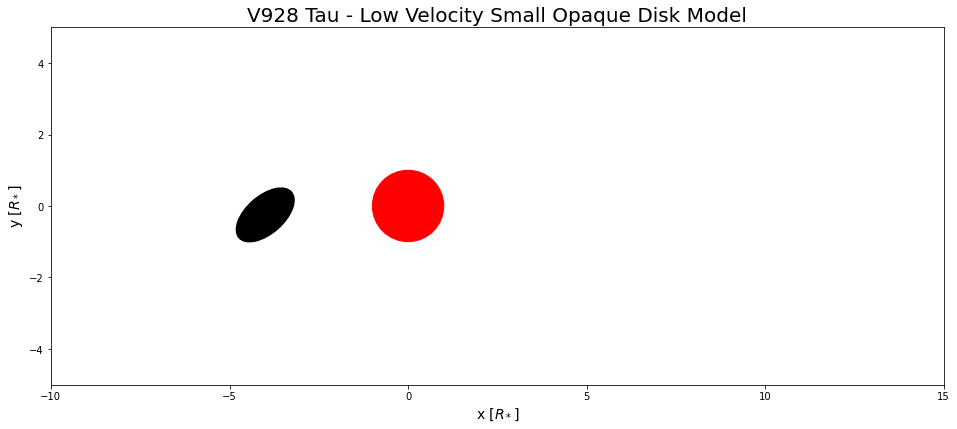

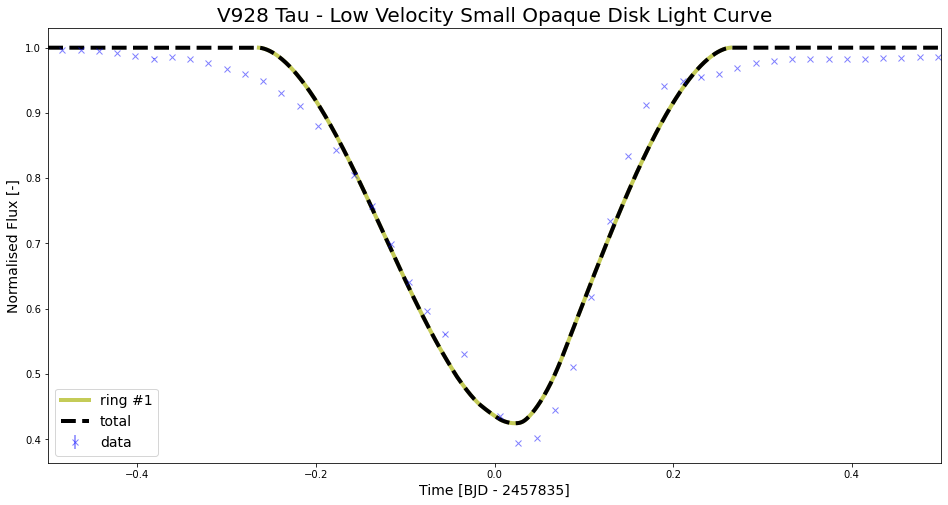

In [9]:
# for the low velocity small opaque disk
r2, b2, i2, t2, v2, x2  = pb_ldr_od
lcm2 = eclipse.light_curve_model(model_time, [r2], b2, i2, t2, v2, x2, [1], 0.7220, 1, 0)
eclipse.make_plots(*lcm2, model_time, time, flux, error, 'V928 Tau - Low Velocity Small Opaque Disk', dt=3002)